## Import dependencies

In [1]:
import sys
print(sys.version)

3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)]


In [2]:
%pip install librosa seaborn numpy Ipython noisereduce matplotlib tqdm scipy soundfile keras imblearn helper tensorflow==2.8.0 iterative-stratification


[notice] A new release of pip is available: 23.0.1 -> 23.2.1
[notice] To update, run: C:\Users\leeju\Birdgit\audio\Scripts\python.exe -m pip install --upgrade pip


In [3]:
%pip install protobuf==3.20.1

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 23.2.1
[notice] To update, run: C:\Users\leeju\Birdgit\audio\Scripts\python.exe -m pip install --upgrade pip


In [4]:
import librosa
import seaborn as sns
import numpy as np
import pandas as pd
import tensorflow as tf
import os
import random
from numpy import where
import csv
import imblearn
import soundfile as sf
import IPython.display as ipd
import noisereduce as nr
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder#
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import ADASYN
from tqdm import tqdm
from scipy.signal import butter, lfilter
from tensorflow import keras

import keras
import keras.utils
from keras import utils as np_utils

from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix, ConfusionMatrixDisplay

## Data Visualisation

In [5]:
#dataset_path = r'C:\Users\leeju\BirdProject\dataset_updated_exported'
dataset_path = r'H:\dataset_updated_exported'

In [6]:
# function to return bird name from first index with dot seperation
def extract_bird_class(bird_name):
    return bird_name.split('.')[0]

In [7]:
# list of folder to loop into all subfolders for wav files
folders = ['fold1_export', 'fold2_export', 'fold3_export', 'fold4_export', 'fold5_export', 'fold6_export', 'fold7_export', 'fold8_export', 'fold9_export', 'fold10_export',
           'fold11_export', 'fold12_export', 'fold13_export', 'fold14_export', 'fold15_export', 'fold16_export', 'fold17_export', 'fold18_export', 'fold19_export',
           'fold20_export', 'fold21_export', 'fold22_export', 'fold23_export', 'fold24_export', 'fold25_export', 'fold26_export', 'fold27_export', 'fold28_export', 
           'fold29_export', 'fold30_export', 'fold31_export', 'fold32_export', 'fold33_export', 'fold34_export', 'fold35_export', 'fold36_export', 'fold37_export',
           'fold38_export', 'fold39_export', 'fold40_export', 'fold41_export', 'fold42_export', 'fold43_export', 'fold44_export']

In [8]:
# Visualise bird classes with bar graph
def plot_bird_class_counts(): #bird_class_counts
    sns.set(style="whitegrid")
    plt.figure(figsize=(20, 8))
    ax=sns.barplot(x=list(bird_class_counts.keys()), y=list(bird_class_counts.values()))
    plt.title('Number of Bird Classes in Dataset')
    plt.xticks(rotation=75)
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', (p.get_x()+0.4, p.get_height()), ha='center', va='bottom', color='black', size=12)
    plt.xlabel('Bird Classes')
    plt.ylabel('Counts')
    plt.tight_layout()
    plt.show()

In [9]:
# Function for calculating statistical summary
def calculate_statistics(class_counts):
    count_values=list(class_counts.values())
    sum_count=sum(count_values)
    mean_count=sum(count_values)/len(count_values)
    max_count=max(count_values)
    min_count=min(count_values)
    return sum_count, mean_count, max_count, min_count

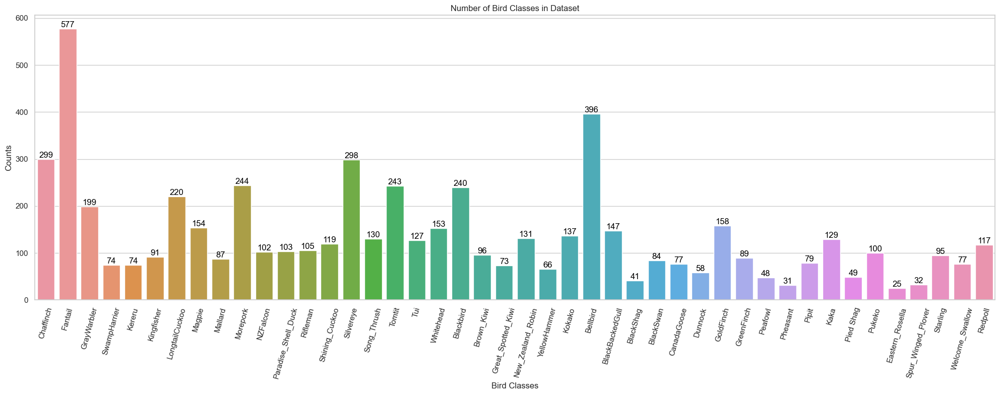

In [10]:
# counter for each bird subfolder #Change file names
bird_class_counts = Counter()

# Iterate through each bird class and name
for folds in folders:
    folder_path=f'{dataset_path}/{folds}'
    wav_files=librosa.util.find_files(folder_path, ext='wav')
    bird_classes=[extract_bird_class(os.path.basename(file)) for file in wav_files]
    bird_class_counts.update(bird_classes)

plot_bird_class_counts() #bird_class_counts

In [11]:
# Statistical summary
sum_count, mean_count, max_count, min_count = calculate_statistics(bird_class_counts)

print(f"[Total]: {sum_count}")
print(f"[Mean]: {mean_count:.2f}")
print(f"[Max]: {max_count}")
print(f"[Min]: {min_count}")

[Total]: 5974
[Mean]: 135.77
[Max]: 577
[Min]: 25


## Audio Preprocessing

In [12]:
# Loop through each folder to check any varying sample rate

# Set path directory
folds = os.listdir(dataset_path)

# Loop through each fold
for fold in tqdm(folds, desc='Progression'):
    folder_path = os.path.join(dataset_path, fold)
    wav_files = librosa.util.find_files(folder_path, ext='wav')
    
    # Loop through each wav file in the folder
    for wav_file in wav_files:
        audio, sr = librosa.load(wav_file, sr=None)
        print(f"Sample rate for {wav_file}: {sr} Hz")

Progression:   0%|                                                                              | 0/44 [00:00<?, ?it/s]

Sample rate for H:\dataset_updated_exported\fold10_export\Morepork.001.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold10_export\Morepork.002.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold10_export\Morepork.003.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold10_export\Morepork.004.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold10_export\Morepork.005.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold10_export\Morepork.006.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold10_export\Morepork.007.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold10_export\Morepork.008.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold10_export\Morepork.009.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold10_export\Morepork.010.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold10_export\Morepork.011.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold10_export\Morepor

Progression:   5%|███▏                                                                  | 2/44 [00:01<00:35,  1.20it/s]

Sample rate for H:\dataset_updated_exported\fold11_export\NZFalcon.001.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold11_export\NZFalcon.002.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold11_export\NZFalcon.003.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold11_export\NZFalcon.004.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold11_export\NZFalcon.005.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold11_export\NZFalcon.006.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold11_export\NZFalcon.007.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold11_export\NZFalcon.008.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold11_export\NZFalcon.009.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold11_export\NZFalcon.010.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold11_export\NZFalcon.011.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold11_export\NZFalco

Progression:   7%|████▊                                                                 | 3/44 [00:02<00:21,  1.89it/s]

Sample rate for H:\dataset_updated_exported\fold12_export\Paradise_Shell_Duck.40.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold12_export\Paradise_Shell_Duck.41.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold12_export\Paradise_Shell_Duck.42.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold12_export\Paradise_Shell_Duck.43.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold12_export\Paradise_Shell_Duck.44.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold12_export\Paradise_Shell_Duck.45.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold12_export\Paradise_Shell_Duck.46.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold12_export\Paradise_Shell_Duck.47.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold12_export\Paradise_Shell_Duck.48.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold12_export\Paradise_Shell_Duck.49.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold12

Progression:   9%|██████▎                                                               | 4/44 [00:02<00:15,  2.55it/s]

Sample rate for H:\dataset_updated_exported\fold13_export\Rifleman.57.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold13_export\Rifleman.58.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold13_export\Rifleman.59.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold13_export\Rifleman.6.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold13_export\Rifleman.60.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold13_export\Rifleman.61.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold13_export\Rifleman.62.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold13_export\Rifleman.63.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold13_export\Rifleman.64.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold13_export\Rifleman.65.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold13_export\Rifleman.66.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold13_export\Rifleman.67.wav: 44

Progression:  11%|███████▉                                                              | 5/44 [00:02<00:11,  3.30it/s]

Sample rate for H:\dataset_updated_exported\fold14_export\Shining_Cuckoo.79.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold14_export\Shining_Cuckoo.8.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold14_export\Shining_Cuckoo.80.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold14_export\Shining_Cuckoo.81.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold14_export\Shining_Cuckoo.82.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold14_export\Shining_Cuckoo.83.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold14_export\Shining_Cuckoo.84.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold14_export\Shining_Cuckoo.85.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold14_export\Shining_Cuckoo.86.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold14_export\Shining_Cuckoo.87.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold14_export\Shining_Cuckoo.88.wav: 44100 Hz
Sample rate

Progression:  14%|█████████▌                                                            | 6/44 [00:02<00:14,  2.65it/s]

Sample rate for H:\dataset_updated_exported\fold15_export\Silvereye.38.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold15_export\Silvereye.39.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold15_export\Silvereye.4.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold15_export\Silvereye.40.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold15_export\Silvereye.41.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold15_export\Silvereye.42.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold15_export\Silvereye.43.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold15_export\Silvereye.44.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold15_export\Silvereye.45.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold15_export\Silvereye.46.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold15_export\Silvereye.47.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold15_export\Silverey

Progression:  16%|███████████▏                                                          | 7/44 [00:03<00:11,  3.09it/s]

Sample rate for H:\dataset_updated_exported\fold16_export\Song_Thrush.31.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold16_export\Song_Thrush.32.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold16_export\Song_Thrush.33.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold16_export\Song_Thrush.34.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold16_export\Song_Thrush.35.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold16_export\Song_Thrush.36.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold16_export\Song_Thrush.37.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold16_export\Song_Thrush.38.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold16_export\Song_Thrush.39.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold16_export\Song_Thrush.4.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold16_export\Song_Thrush.40.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\

Progression:  18%|████████████▋                                                         | 8/44 [00:03<00:12,  2.81it/s]

Sample rate for H:\dataset_updated_exported\fold17_export\Tomtit.246.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold17_export\Tomtit.247.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold17_export\Tomtit.25.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold17_export\Tomtit.26.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold17_export\Tomtit.27.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold17_export\Tomtit.28.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold17_export\Tomtit.29.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold17_export\Tomtit.3.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold17_export\Tomtit.30.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold17_export\Tomtit.31.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold17_export\Tomtit.32.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold17_export\Tomtit.33.wav: 44100 Hz
Sample rate for

Progression:  20%|██████████████▎                                                       | 9/44 [00:03<00:10,  3.20it/s]

Sample rate for H:\dataset_updated_exported\fold18_export\Tui.121.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold18_export\Tui.122.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold18_export\Tui.123.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold18_export\Tui.124.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold18_export\Tui.125.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold18_export\Tui.126.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold18_export\Tui.127.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold18_export\Tui.13.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold18_export\Tui.14.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold18_export\Tui.15.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold18_export\Tui.16.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold18_export\Tui.17.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\f

Progression:  23%|███████████████▋                                                     | 10/44 [00:04<00:10,  3.38it/s]

Sample rate for H:\dataset_updated_exported\fold19_export\Whitehead.89.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold19_export\Whitehead.9.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold19_export\Whitehead.90.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold19_export\Whitehead.91.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold19_export\Whitehead.92.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold19_export\Whitehead.93.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold19_export\Whitehead.94.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold19_export\Whitehead.95.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold19_export\Whitehead.96.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold19_export\Whitehead.97.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold19_export\Whitehead.98.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold19_export\Whitehea

Progression:  25%|█████████████████▎                                                   | 11/44 [00:04<00:11,  2.91it/s]

Sample rate for H:\dataset_updated_exported\fold1_export\Chaffinch.222.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold1_export\Chaffinch.223.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold1_export\Chaffinch.224.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold1_export\Chaffinch.225.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold1_export\Chaffinch.226.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold1_export\Chaffinch.227.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold1_export\Chaffinch.228.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold1_export\Chaffinch.229.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold1_export\Chaffinch.230.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold1_export\Chaffinch.231.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold1_export\Chaffinch.232.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold1_export\Chaffinc

Progression:  27%|██████████████████▊                                                  | 12/44 [00:04<00:11,  2.75it/s]

Sample rate for H:\dataset_updated_exported\fold20_export\Blackbird.79.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold20_export\Blackbird.8.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold20_export\Blackbird.80.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold20_export\Blackbird.81.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold20_export\Blackbird.82.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold20_export\Blackbird.83.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold20_export\Blackbird.84.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold20_export\Blackbird.85.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold20_export\Blackbird.86.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold20_export\Blackbird.87.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold20_export\Blackbird.88.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold20_export\Blackbir

Progression:  32%|█████████████████████▉                                               | 14/44 [00:05<00:07,  4.05it/s]

Sample rate for H:\dataset_updated_exported\fold22_export\Great_Spotted_Kiwi.1.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold22_export\Great_Spotted_Kiwi.10.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold22_export\Great_Spotted_Kiwi.11.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold22_export\Great_Spotted_Kiwi.12.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold22_export\Great_Spotted_Kiwi.13.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold22_export\Great_Spotted_Kiwi.14.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold22_export\Great_Spotted_Kiwi.15.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold22_export\Great_Spotted_Kiwi.16.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold22_export\Great_Spotted_Kiwi.17.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold22_export\Great_Spotted_Kiwi.18.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold22_export\Gre

Progression:  36%|█████████████████████████                                            | 16/44 [00:05<00:05,  4.73it/s]

Sample rate for H:\dataset_updated_exported\fold8_export\Magpie.213.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold8_export\Magpie.214.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold8_export\Magpie.215.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold8_export\Magpie.216.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold8_export\Magpie.217.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold8_export\Magpie.218.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold8_export\Magpie.219.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold8_export\Magpie.220.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold8_export\Magpie.221.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold8_export\Magpie.222.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold8_export\Magpie.224.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold8_export\Magpie.225.wav: 44100 Hz
Sample rate for 

Progression:  41%|████████████████████████████▏                                        | 18/44 [00:05<00:05,  5.04it/s]

Sample rate for H:\dataset_updated_exported\fold25_export\Kokako.177.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold25_export\Kokako.178.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold25_export\Kokako.179.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold25_export\Kokako.190.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold25_export\Kokako.191.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.001.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.002.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.003.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.004.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.005.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.006.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.007.wav:

Progression:  43%|█████████████████████████████▊                                       | 19/44 [00:06<00:07,  3.20it/s]

Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.493.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.494.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.495.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.496.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.497.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.498.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.499.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.500.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.501.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.502.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbird.503.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold26_export\Bellbir

Progression:  45%|███████████████████████████████▎                                     | 20/44 [00:06<00:06,  3.45it/s]

Sample rate for H:\dataset_updated_exported\fold27_export\BlackBackedGull.071.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold27_export\BlackBackedGull.072.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold27_export\BlackBackedGull.073.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold27_export\BlackBackedGull.074.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold27_export\BlackBackedGull.075.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold27_export\BlackBackedGull.076.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold27_export\BlackBackedGull.077.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold27_export\BlackBackedGull.078.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold27_export\BlackBackedGull.079.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold27_export\BlackBackedGull.080.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold27_export\BlackBackedGull.081.wa

Progression:  50%|██████████████████████████████████▌                                  | 22/44 [00:07<00:04,  4.61it/s]

Sample rate for H:\dataset_updated_exported\fold29_export\BlackSwan.012.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold29_export\BlackSwan.013.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold29_export\BlackSwan.014.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold29_export\BlackSwan.015.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold29_export\BlackSwan.016.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold29_export\BlackSwan.017.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold29_export\BlackSwan.018.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold29_export\BlackSwan.019.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold29_export\BlackSwan.021.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold29_export\BlackSwan.022.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold29_export\BlackSwan.023.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold29_exp

Progression:  52%|████████████████████████████████████                                 | 23/44 [00:08<00:08,  2.50it/s]

Sample rate for H:\dataset_updated_exported\fold2_export\Fantail.509.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold2_export\Fantail.510.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold2_export\Fantail.511.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold2_export\Fantail.512.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold2_export\Fantail.513.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold2_export\Fantail.514.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold2_export\Fantail.515.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold2_export\Fantail.516.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold2_export\Fantail.517.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold2_export\Fantail.518.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold2_export\Fantail.519.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold2_export\Fantail.520.wav: 44100 Hz
Samp

Progression:  55%|█████████████████████████████████████▋                               | 24/44 [00:08<00:06,  3.04it/s]

Sample rate for H:\dataset_updated_exported\fold30_export\CanadaGoose.073.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold30_export\CanadaGoose.074.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold30_export\CanadaGoose.075.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold30_export\CanadaGoose.076.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold30_export\CanadaGoose.077.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold30_export\CanadaGoose.078 (2s).wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold31_export\Dunnock.001.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold31_export\Dunnock.002.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold31_export\Dunnock.003.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold31_export\Dunnock.005.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold31_export\Dunnock.006.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fol

Progression:  59%|████████████████████████████████████████▊                            | 26/44 [00:08<00:04,  3.75it/s]

Sample rate for H:\dataset_updated_exported\fold32_export\GoldFinch.073.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold32_export\GoldFinch.074.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold32_export\GoldFinch.075.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold32_export\GoldFinch.076.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold32_export\GoldFinch.077.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold32_export\GoldFinch.078.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold32_export\GoldFinch.079.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold32_export\GoldFinch.080.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold32_export\GoldFinch.081.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold32_export\GoldFinch.082.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold32_export\GoldFinch.083.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold32_exp

Progression:  61%|██████████████████████████████████████████▎                          | 27/44 [00:08<00:04,  4.17it/s]

Sample rate for H:\dataset_updated_exported\fold33_export\GreenFinch.025.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold33_export\GreenFinch.026.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold33_export\GreenFinch.027.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold33_export\GreenFinch.029.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold33_export\GreenFinch.030.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold33_export\GreenFinch.031.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold33_export\GreenFinch.032.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold33_export\GreenFinch.033.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold33_export\GreenFinch.034.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold33_export\GreenFinch.035.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold33_export\GreenFinch.036.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported

Progression:  66%|█████████████████████████████████████████████▍                       | 29/44 [00:08<00:02,  5.83it/s]

Sample rate for H:\dataset_updated_exported\fold35_export\Pheasant.18.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold35_export\Pheasant.19.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold35_export\Pheasant.2.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold35_export\Pheasant.20.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold35_export\Pheasant.21.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold35_export\Pheasant.22.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold35_export\Pheasant.23.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold35_export\Pheasant.24.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold35_export\Pheasant.25.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold35_export\Pheasant.26.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold35_export\Pheasant.27.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold35_export\Pheasant.28.wav: 44

Progression:  70%|████████████████████████████████████████████████▌                    | 31/44 [00:09<00:02,  6.25it/s]

Sample rate for H:\dataset_updated_exported\fold37_export\Kaka.48 (2s).wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold37_export\Kaka.49.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold37_export\Kaka.5.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold37_export\Kaka.50.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold37_export\Kaka.51.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold37_export\Kaka.52.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold37_export\Kaka.53.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold37_export\Kaka.54.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold37_export\Kaka.55.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold37_export\Kaka.56.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold37_export\Kaka.57.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold37_export\Kaka.58.wav: 44100 Hz
Sample rate for H:\dataset_updated_e

Progression:  73%|██████████████████████████████████████████████████▏                  | 32/44 [00:09<00:01,  6.19it/s]

Sample rate for H:\dataset_updated_exported\fold39_export\Pukeko.54.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold39_export\Pukeko.55.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold39_export\Pukeko.56.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold39_export\Pukeko.57 (2s).wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold39_export\Pukeko.58.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold39_export\Pukeko.59.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold39_export\Pukeko.6.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold39_export\Pukeko.60.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold39_export\Pukeko.61.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold39_export\Pukeko.62.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold39_export\Pukeko.63.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold39_export\Pukeko.64.wav: 44100 Hz
Sample rate 

Progression:  82%|████████████████████████████████████████████████████████▍            | 36/44 [00:09<00:01,  6.99it/s]

Sample rate for H:\dataset_updated_exported\fold41_export\Spur_Winged_Plover.1.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold41_export\Spur_Winged_Plover.10.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold41_export\Spur_Winged_Plover.11.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold41_export\Spur_Winged_Plover.12.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold41_export\Spur_Winged_Plover.13.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold41_export\Spur_Winged_Plover.14.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold41_export\Spur_Winged_Plover.15.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold41_export\Spur_Winged_Plover.16.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold41_export\Spur_Winged_Plover.17.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold41_export\Spur_Winged_Plover.18.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold41_export\Spu

Progression:  84%|██████████████████████████████████████████████████████████           | 37/44 [00:09<00:00,  7.17it/s]

Sample rate for H:\dataset_updated_exported\fold43_export\Welcome_Swallow.1.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold43_export\Welcome_Swallow.10.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold43_export\Welcome_Swallow.11.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold43_export\Welcome_Swallow.12.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold43_export\Welcome_Swallow.13.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold43_export\Welcome_Swallow.14.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold43_export\Welcome_Swallow.15.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold43_export\Welcome_Swallow.16.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold43_export\Welcome_Swallow.17.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold43_export\Welcome_Swallow.18.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold43_export\Welcome_Swallow.19.wav: 44100 Hz


Progression:  86%|███████████████████████████████████████████████████████████▌         | 38/44 [00:10<00:00,  6.98it/s]

Sample rate for H:\dataset_updated_exported\fold44_export\Redpoll.52.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold44_export\Redpoll.53.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold44_export\Redpoll.54.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold44_export\Redpoll.55.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold44_export\Redpoll.56 (2s).wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold44_export\Redpoll.57.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold44_export\Redpoll.58.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold44_export\Redpoll.59.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold44_export\Redpoll.6.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold44_export\Redpoll.60.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold44_export\Redpoll.61.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold44_export\Redpoll.62.wav: 44100 Hz


Progression:  93%|████████████████████████████████████████████████████████████████▎    | 41/44 [00:10<00:00,  8.25it/s]

Sample rate for H:\dataset_updated_exported\fold5_export\Kereru.025.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold5_export\Kereru.026.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold5_export\Kereru.027.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold5_export\Kereru.028.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold5_export\Kereru.029.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold5_export\Kereru.030.wav: 22050 Hz
Sample rate for H:\dataset_updated_exported\fold5_export\Kereru.031.wav: 22050 Hz
Sample rate for H:\dataset_updated_exported\fold5_export\Kereru.032.wav: 22050 Hz
Sample rate for H:\dataset_updated_exported\fold5_export\Kereru.033.wav: 22050 Hz
Sample rate for H:\dataset_updated_exported\fold5_export\Kereru.034.wav: 22050 Hz
Sample rate for H:\dataset_updated_exported\fold5_export\Kereru.035.wav: 22050 Hz
Sample rate for H:\dataset_updated_exported\fold5_export\Kereru.036.wav: 22050 Hz
Sample rate for 

Progression:  95%|█████████████████████████████████████████████████████████████████▊   | 42/44 [00:10<00:00,  5.65it/s]

Sample rate for H:\dataset_updated_exported\fold7_export\LongtailCuckoo.139.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold7_export\LongtailCuckoo.140.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold7_export\LongtailCuckoo.141.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold7_export\LongtailCuckoo.142.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold7_export\LongtailCuckoo.143.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold7_export\LongtailCuckoo.144.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold7_export\LongtailCuckoo.145.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold7_export\LongtailCuckoo.146.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold7_export\LongtailCuckoo.147.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold7_export\LongtailCuckoo.148.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold7_export\LongtailCuckoo.149.wav: 44100 Hz
Sample rat

Progression:  98%|███████████████████████████████████████████████████████████████████▍ | 43/44 [00:10<00:00,  6.10it/s]

Sample rate for H:\dataset_updated_exported\fold9_export\Mallard.056.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold9_export\Mallard.057.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold9_export\Mallard.058.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold9_export\Mallard.059.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold9_export\Mallard.060.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold9_export\Mallard.061.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold9_export\Mallard.062.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold9_export\Mallard.063.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold9_export\Mallard.064.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold9_export\Mallard.065.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold9_export\Mallard.066.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold9_export\Mallard.067.wav: 44100 Hz
Samp

Progression: 100%|█████████████████████████████████████████████████████████████████████| 44/44 [00:11<00:00,  3.96it/s]

Sample rate for H:\dataset_updated_exported\fold23_export\New_Zealand_Robin.92.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold23_export\New_Zealand_Robin.93.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold23_export\New_Zealand_Robin.94.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold23_export\New_Zealand_Robin.95.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold23_export\New_Zealand_Robin.96.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold23_export\New_Zealand_Robin.97.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold23_export\New_Zealand_Robin.98.wav: 44100 Hz
Sample rate for H:\dataset_updated_exported\fold23_export\New_Zealand_Robin.99.wav: 44100 Hz


Audios are all 41k sample rate. Gonna use standard 22050 sample rate for all audio when processing for faster computational and analysing

In [13]:
# Validate sample rate of 22050
sr

44100

In [14]:
# Check number of audio samples in audio signal
audio.shape

(132300,)

In [15]:
# Double check audio's length in seconds
1577020/sr

35.76009070294785

## Noise Reduce

### Noise reduce cite:

```
@article{sainburg2020finding,
  title={Finding, visualizing, and quantifying latent structure across diverse animal vocal repertoires},
  author={Sainburg, Tim and Thielk, Marvin and Gentner, Timothy Q},
  journal={PLoS computational biology},
  volume={16},
  number={10},
  pages={e1008228},
  year={2020},
  publisher={Public Library of Science}
}

@software{tim_sainburg_2019_3243139,
  author       = {Tim Sainburg},
  title        = {timsainb/noisereduce: v1.0},
  month        = jun,
  year         = 2019,
  publisher    = {Zenodo},
  version      = {db94fe2},
  doi          = {10.5281/zenodo.3243139},
  url          = {https://doi.org/10.5281/zenodo.3243139}
}
```

## Testing Noise Reduce on a sample

In [16]:
# Declare audio path of 2 samples
#c_sample = r'C:\Users\leeju\BirdProject\dataset_updated\fold1\mnr-20080627-0601-Chaffinch-048.wav'
c_sample = r'C:\Users\leeju\BirdProject\dataset_updated\fold1\mnr-20080627-0601-Chaffinch-048.wav'

In [17]:
# Load audio signals using librosa
crnz, sr = librosa.load(c_sample, sr=22050)

In [18]:
sr

22050

In [19]:
# Audio in 1D array, mono-channel with librosa
crnz

array([-6.1228735e-07,  1.6854711e-06,  3.8645467e-06, ...,
       -3.0612224e-05, -2.7874084e-05, -3.3190416e-05], dtype=float32)

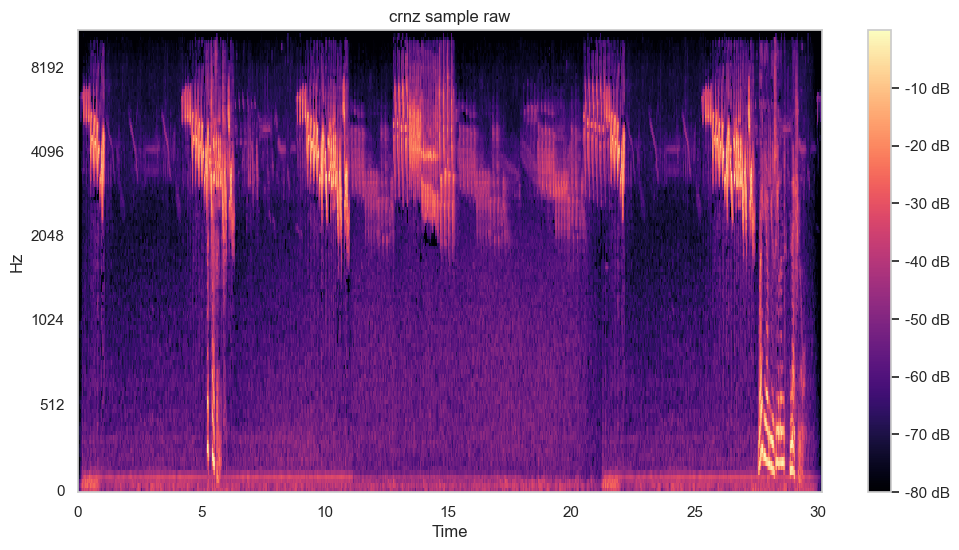

In [20]:
# Create this into a function later
sample0 = librosa.feature.melspectrogram(y=crnz,
                                         sr=sr, 
                                         n_fft=2048, 
                                         hop_length=512, 
                                         n_mels=128)
# mel_spectrogram is taken in by M_db
M_db = librosa.power_to_db(sample0, ref=np.max)
plt.figure(figsize=(12,6)) # Image display only
image = librosa.display.specshow(M_db,        
                                 x_axis='time',
                                 y_axis='mel', 
                                 sr=sr)
plt.title("crnz sample raw")
plt.colorbar(image, format="%2.f dB")
ipd.Audio(data=crnz, rate=sr)

In [21]:
# Apply stationary noise reduction (calculates each frequency channel for noise gate). We use stationary here because we cannot predict when unwanted audio will be present 
reduced_noise_crnz = nr.reduce_noise(y=crnz, 
                                     sr=sr, 
                                     n_fft=2048, 
                                     hop_length=512,
                                     thresh_n_mult_nonstationary=2.5,
                                     stationary=False)

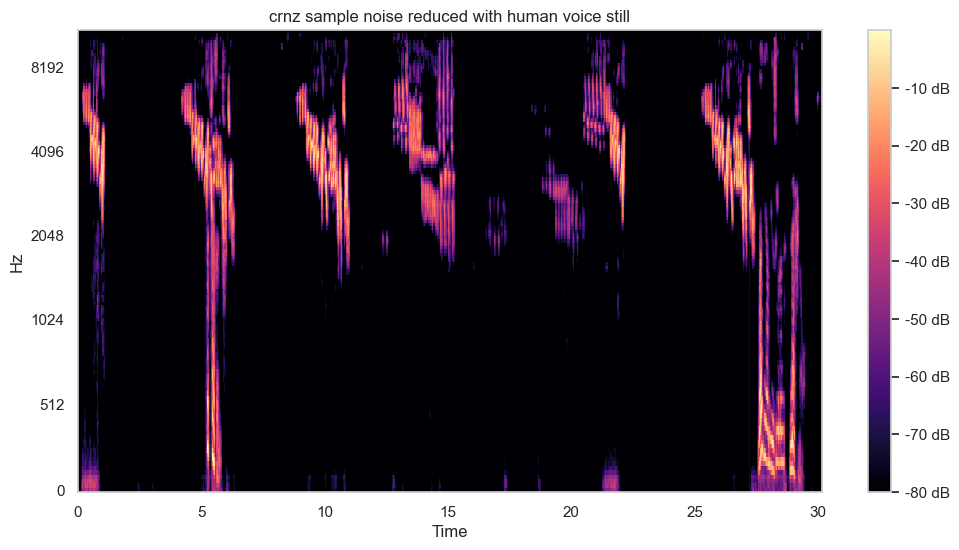

In [22]:
# Hear sample audio and plot mel-spectrogram

sample1 = librosa.feature.melspectrogram(y=reduced_noise_crnz,
                                         sr=sr, 
                                         n_fft=2048, 
                                         hop_length=512, 
                                         n_mels=128)
# mel_spectrogram is taken in by M_db
M_db = librosa.power_to_db(sample1, ref=np.max)
plt.figure(figsize=(12,6)) # Image display only
image = librosa.display.specshow(M_db,        
                                 x_axis='time',
                                 y_axis='mel', 
                                 sr=sr)
plt.title("crnz sample noise reduced with human voice still")
plt.colorbar(image, format="%2.f dB")
ipd.Audio(data=reduced_noise_crnz, rate=sr)

The background noise has been successfully reduce, however, the narrator's voice still remains seen by the long line down the mel axis (Hz in librosa). We got to filter out the human voice first. I will perform attenuating and removing the human vocal as seen in figure 1 to 4. 

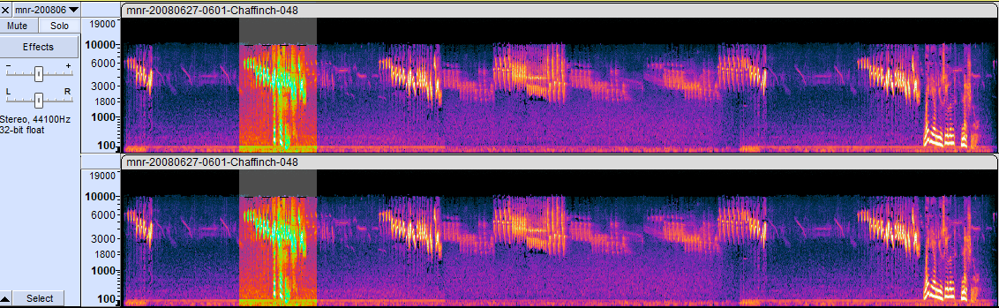
##### Fig 1. Focusing area of sample audio to remove human vocal and attenuate.
#
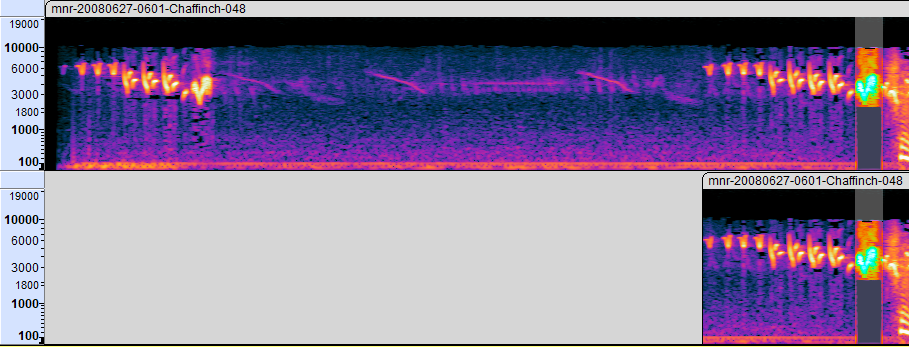
##### Fig 2. Highlight section with unwanted human vocal with bird noise. Rest remove.
#
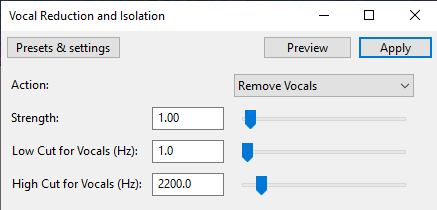
##### Fig 3. Frequency cutoff to remove human vocal.
#
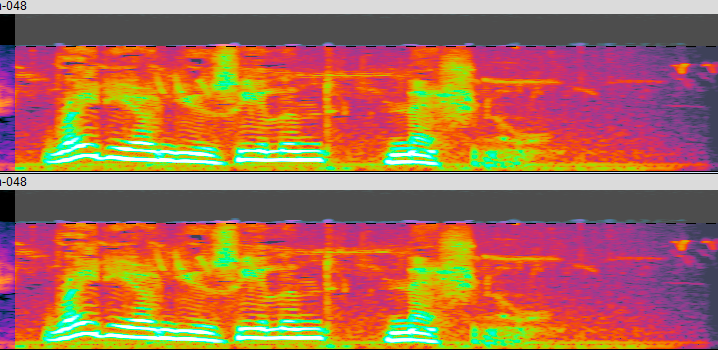
##### Fig 4. Remove this section as human vocal.
#

In [23]:
# Declare audio path of 2 samples
#UPDATED
c_sample = r'C:\Users\leeju\BirdProject\dataset_updated\fold1\mnr-20080627-0601-Chaffinch-048_2.wav'

In [24]:
# Load audio signals using librosa
crnz2, sr = librosa.load(c_sample, sr=22050)

In [25]:
# Apply stationary noise reduction (calculates each frequency channel for noise gate). We use stationary here because we cannot predict when unwanted audio will be present 
reduced_noise_crnz2 = nr.reduce_noise(y=crnz2, 
                                     sr=sr, 
                                     n_fft=2048, 
                                     hop_length=512,
                                     thresh_n_mult_nonstationary=2.5,
                                     stationary=False)

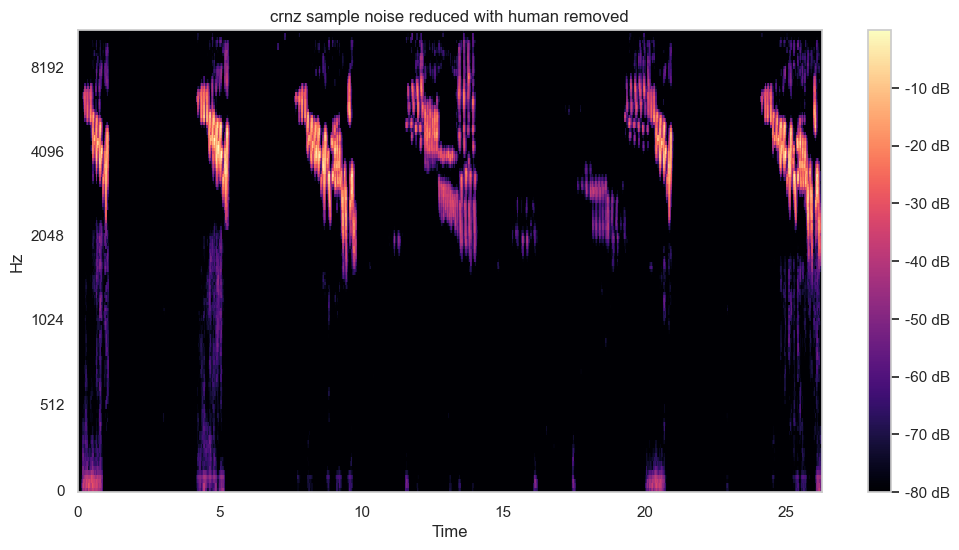

In [26]:
# Hear sample audio and plot mel-spectrogram

sample2 = librosa.feature.melspectrogram(y=reduced_noise_crnz2,
                                         sr=sr, 
                                         n_fft=2048, 
                                         hop_length=512, 
                                         n_mels=128)
# mel_spectrogram is taken in by M_db
M_db = librosa.power_to_db(sample2, ref=np.max)
plt.figure(figsize=(12,6)) # Image display only
image2 = librosa.display.specshow(M_db,        
                                 x_axis='time',
                                 y_axis='mel', 
                                 sr=sr)
plt.title("crnz sample noise reduced with human removed")
plt.colorbar(image2, format="%2.f dB")
ipd.Audio(data=reduced_noise_crnz2, rate=sr)

This audio still has residuals that needs to be filtered. Then, rest of the audio will need to be segmented into approx 3 seconds and remove blank areas.

## Fourth Order Butterworth Filter

In [27]:
# Define the filter order and normalized critical frequency
order=4
cutoff_freq=3000

# High-pass Butterworth filter
b, a = butter(N=order, Wn=cutoff_freq/(0.5*sr), btype='high', analog=False)

# Apply the filter to the audio data using lfilter
filtered_audio_crnz2 = lfilter(b, a, reduced_noise_crnz2)



def butterworth_filter(audio, sr, cutoff_freq):

    order = 4  # Filter order

    # Design the Butterworth high-pass filter
    b, a = butter(N=order, Wn=cutoff_freq / (0.5 * sr), btype='high', analog=False)

    # Apply the filter to the audio data using lfilter
    filtered_audio = lfilter(b, a, audio)

    return filtered_audio

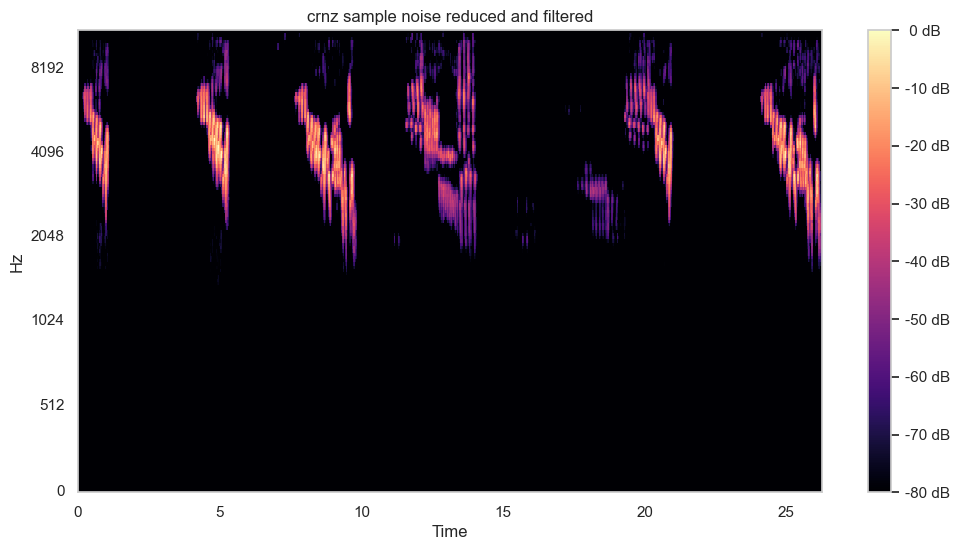

In [28]:
# Show final result
sample3 = librosa.feature.melspectrogram(y=filtered_audio_crnz2,
                                         sr=sr, 
                                         n_fft=2048, 
                                         hop_length=512, 
                                         n_mels=128)
# mel_spectrogram is taken in by M_db
M_db = librosa.power_to_db(sample3, ref=np.max)
plt.figure(figsize=(12,6)) 
image3 = librosa.display.specshow(M_db,        
                                 x_axis='time',
                                 y_axis='mel', 
                                 sr=sr)
plt.title("crnz sample noise reduced and filtered")
plt.colorbar(image3, format="%2.f dB")
ipd.Audio(data=filtered_audio_crnz2, rate=sr)

In [29]:
# Define the filter order and normalized critical frequency
order=4
cutoff_freq=3000

# Design the digital high-pass Butterworth filter
b, a = butter(N=order, Wn=cutoff_freq/(0.5*sr), btype='high', analog=False)

# Apply the filter to the audio data using lfilter
filtered_audio_crnz2 = lfilter(b, a, reduced_noise_crnz2)

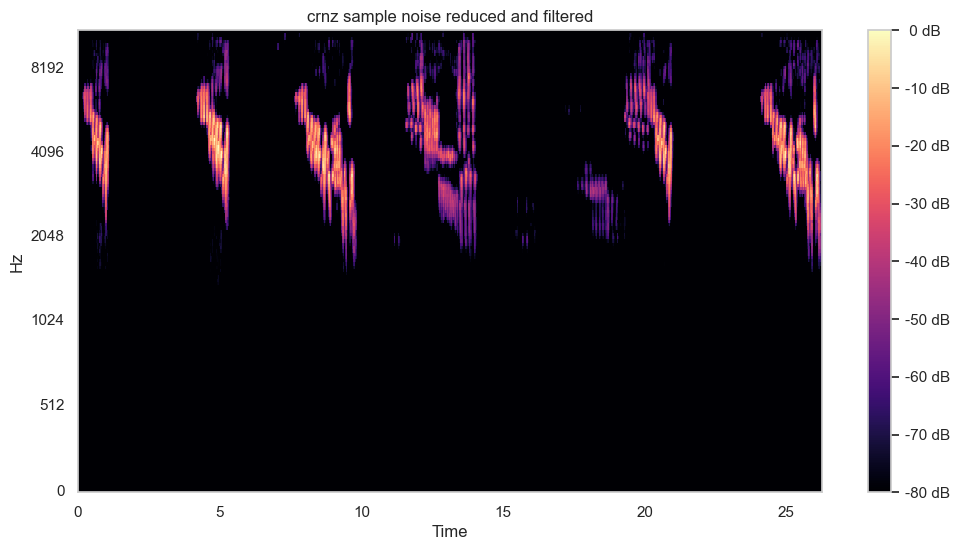

In [30]:
# Show final result
sample3 = librosa.feature.melspectrogram(y=filtered_audio_crnz2,
                                         sr=sr, 
                                         n_fft=2048, 
                                         hop_length=512, 
                                         n_mels=128)
# mel_spectrogram is taken in by M_db
M_db = librosa.power_to_db(sample3, ref=np.max)
plt.figure(figsize=(12,6)) 
image3 = librosa.display.specshow(M_db,        
                                 x_axis='time',
                                 y_axis='mel', 
                                 sr=sr)
plt.title("crnz sample noise reduced and filtered")
plt.colorbar(image3, format="%2.f dB")
ipd.Audio(data=filtered_audio_crnz2, rate=sr)

## Feature Extraction


- After the audio files have all been manually cleaned and split into 3 second segments, we can get the Mel-Spectrograms for input and bird species for label.

In [31]:
# Take file path that contains subfolders to return content as a list (i.e [fold1, fold2, etc])
sub_folds = os.listdir(dataset_path)

In [32]:
# Function to create metadata CSV

# counter for classID assignment to bird class

def metadata():
    # Assign columns
    column = ['slice_file_name', 'class', 'class_id', 'fold']
    class_mapping = {
        'Morepork':0, 'NZFalcon':1, 'Paradise_Shell_Duck':2, 'Rifleman':3, 'Shining_Cuckoo':4,
        'Silvereye':5, 'Song_Thrush':6, 'Tomtit':7, 'Tui':8, 'Whitehead':9, 'Chaffinch':10, 
        'Blackbird':11, 'Brown_Kiwi':12, 'Great_Spotted_Kiwi':13, 'Pied Shag':14, 
        'Magpie':15, 'YellowHammer':16, 'Kokako':17, 'Bellbird':18, 'BlackBackedGull':19,
        'BlackShag':20, 'BlackSwan':21, 'Fantail':22, 'CanadaGoose':23, 'Dunnock':24, 'GoldFinch':25, 
        'GreenFinch':26, 'Peafowl':27, 'Pheasant':28, 'Pipit':29, 'Kaka':30,
        'Pukeko':31, 'Eastern_Rosella':32, 'GrayWarbler':33, 'Spur_Winged_Plover':34, 
        'Starling':35, 'Welcome_Swallow':36, 'Redpoll':37, 'SwampHarrier':38, 
        'Kereru':39, 'Kingfisher':40, 'LongtailCuckoo':41, 'Mallard':42,
        'New_Zealand_Robin':43
    }

    # Create a list to store rows for all files
    combine_rows = []

    # Iterate through sub-folders
    for fold in sub_folds:
        fold_path = os.path.join(dataset_path, fold)  # Full path to the current fold1, 2, etc

        # Find all WAV files in the current fold
        wav = librosa.util.find_files(fold_path, ext='wav')

        for file in wav:  
            #
            bird_id = extract_bird_class(os.path.basename(file))
            
            row = [
                os.path.basename(file),
                bird_id,
                class_mapping.get(bird_id),
                fold
            ]
            combine_rows.append(row)

    # Write all rows to the CSV file
    with open(r'C:\Users\leeju\BirdProject\Test.csv', 'w', newline='') as f:
        # CSV writer
        metadata = csv.writer(f)
        metadata.writerow(column)
        metadata.writerows(combine_rows)
    
    return combine_rows

In [33]:
# Call metadata
metadata()

# Read CSV
read_metadata = pd.read_csv(r'C:\Users\leeju\BirdProject\Test.csv')
read_metadata.head()

,slice_file_name,class,class_id,fold
0,Morepork.001.wav,Morepork,0,fold10_export
1,Morepork.002.wav,Morepork,0,fold10_export
2,Morepork.003.wav,Morepork,0,fold10_export
3,Morepork.004.wav,Morepork,0,fold10_export
4,Morepork.005.wav,Morepork,0,fold10_export


In [34]:
# Check bird species
read_metadata['class'].unique()

array(['Morepork', 'NZFalcon', 'Paradise_Shell_Duck', 'Rifleman',
       'Shining_Cuckoo', 'Silvereye', 'Song_Thrush', 'Tomtit', 'Tui',
       'Whitehead', 'Chaffinch', 'Blackbird', 'Brown_Kiwi',
       'Great_Spotted_Kiwi', 'Pied Shag', 'Magpie', 'YellowHammer',
       'Kokako', 'Bellbird', 'BlackBackedGull', 'BlackShag', 'BlackSwan',
       'Fantail', 'CanadaGoose', 'Dunnock', 'GoldFinch', 'GreenFinch',
       'Peafowl', 'Pheasant', 'Pipit', 'Kaka', 'Pukeko',
       'Eastern_Rosella', 'GrayWarbler', 'Spur_Winged_Plover', 'Starling',
       'Welcome_Swallow', 'Redpoll', 'SwampHarrier', 'Kereru',
       'Kingfisher', 'LongtailCuckoo', 'Mallard', 'New_Zealand_Robin'],
      dtype=object)

## Apply noise reduction and extract features

In [41]:
# Assign list for feature and label

def extract_mel():
    features = []
    labels = []

    # Loop through all the audios via metadata guidance for noise reduce
    for fold in tqdm(range(len(read_metadata)), desc='Progression'):
        fold_path = r'H:\dataset_updated_exported\\' + str(read_metadata['fold'][fold]) + '\\' + str(read_metadata['slice_file_name'][fold])
        # Apply noise reduce 
        audios, sr = librosa.load(fold_path, sr=22050)
        reduced_noise_audios = nr.reduce_noise(y=audios,
                                               sr=sr,
                                               n_fft=2048,
                                               hop_length=512,
                                               thresh_n_mult_nonstationary=2.5,
                                               stationary=False)
        # Filter audios 
        average_frequency = np.mean(librosa.feature.melspectrogram(y=reduced_noise_audios, sr=sr))
        # Ensure that the cutoff frequency doesn't exceed Nyquist frequency (half of the sampling rate).
        min_cutoff_freq = min(average_frequency, sr/2)
        
        order=4
        b, a = butter(N=order, Wn= min_cutoff_freq/(0.5*sr), btype='high', analog=False)
        filtered_audio = lfilter(b, a, reduced_noise_audios)

        # Append the features and labels to their corresponding assignment.
        mels = np.mean(librosa.feature.melspectrogram(y=filtered_audio, sr=sr, n_mels=128).T, axis=0) # Transpose mel and label
        features.append(mels)
        labels.append(read_metadata['class_id'][fold])

    return features, labels

features, labels = extract_mel()

Progression: 100%|█████████████████████████████████████████████████████████████████| 5974/5974 [04:08<00:00, 24.00it/s]


Text(0, 0.5, 'Number of Clips')

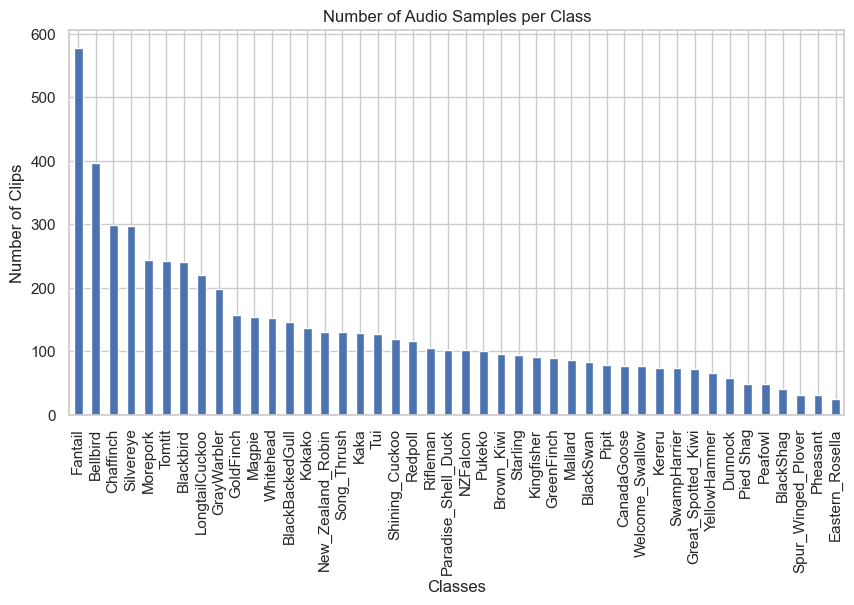

In [36]:
category_group = read_metadata['class'].value_counts()
plot = category_group.plot(kind='bar', title="Number of Audio Samples per Class", figsize=(10,5))
plot.set_xlabel("Classes")
plot.set_ylabel("Number of Clips")

In [78]:
# Assign the feature and label together
temp_data = np.array([features,labels], dtype='object')
extracted = temp_data.transpose()

In [79]:
# Update pandas dataframe with features
extracted_df = pd.DataFrame(extracted, columns=['feature', 'class'])
extracted_df.head()

,feature,class
0,"[291.0737469570962, 0.16870866424437822, 0.070...",0
1,"[32058.402982091302, 495.683192885439, 194.826...",0
2,"[156.00275086708754, 1.9105162526833241, 0.749...",0
3,"[0.3101446252700206, 0.08252976859131401, 0.00...",0
4,"[3962.052271065263, 0.9715176447146787, 0.3428...",0


In [77]:
# Panda DataFrame -> X and Y respectively
X=np.array(extracted_df['feature'].tolist())
Y=np.array(extracted_df['class'].tolist())

In [45]:
# Check newly assigned x shape
X.shape

(5974, 128)

In [46]:
# Y check
Y

array([ 0,  0,  0, ..., 43, 43, 43], dtype=int64)

In [47]:
# Encode the class labels in Y to 'y' with as a label encoder for multiclass classification
y = LabelEncoder().fit_transform(Y)
y

array([ 0,  0,  0, ..., 43, 43, 43], dtype=int64)

## Stratified Cross Validation

- The dataset is imbalance, where Stratified Cross Validation is appealing for maximising training the whole dataset. However, it does not fully solve the case of imbalancing and requires incorporating oversampling techniques like SMOTE, ADASYN, and audio data augmentations are good approaches. However, it is essential to apply Stratified Cross Validation to prevent data leakages before addressing imbalance problems. This will allow each folds or segments to hold a relative equal amounts respect to the label (bird species) across the board and be ready for implementing imbalancing techniques afterwards.

- First, we got to assign 'X' (independent or predictor variable), and 'Y' (dependent or target variable) to split our data for Stratified Cross Validation.

In [48]:
# Apply stratified cross validation with 5 splits, shuffle, with 42 as the seed for consistent shuffle)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Essentially, the train here is validation for stratified cross validation due to fold splitting
for fold, (train_index, val_index) in enumerate(skf.split(X, y)):
    X_train, X_val = X[train_index], X[val_index]
    y_train, y_val = y[train_index], y[val_index]
    
    print(f"Fold {fold+1}: {train_index}, Validation: {val_index}")
    #X_train, X_val = X[train_index], X[val_index]
    #y_train, y_val = y[train_index], y[val_index]
    #fold+=1
    
    #train_data = tf.data.Dataset.from_tensor_slices((X_train, y_train))
    #valid_data = tf.data.Dataset.from_tensor_slices((X_val, y_val))

Fold 1: [   2    3    4 ... 5970 5971 5972], Validation: [   0    1    8 ... 5967 5969 5973]
Fold 2: [   0    1    2 ... 5971 5972 5973], Validation: [  14   18   27 ... 5959 5960 5966]
Fold 3: [   0    1    2 ... 5970 5972 5973], Validation: [   7    9   12 ... 5964 5965 5971]
Fold 4: [   0    1    3 ... 5971 5972 5973], Validation: [   2    5    6 ... 5955 5968 5970]
Fold 5: [   0    1    2 ... 5970 5971 5973], Validation: [   3    4   11 ... 5958 5962 5972]


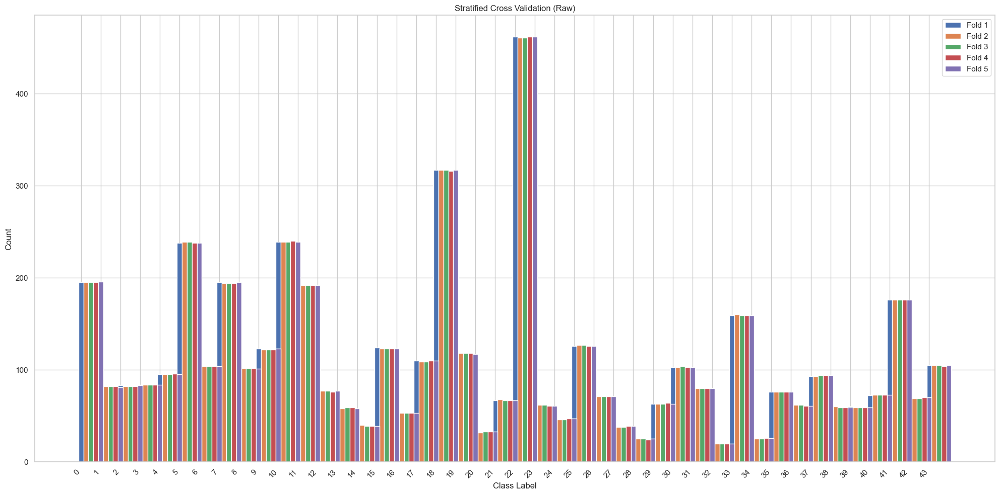

In [49]:
# function to visualise stratification
def strat_plot(X, y, skf):
    class_distributions = []

    # Iterate through folds
    for train_index, test_index in skf.split(X, y):
        y_train = y[train_index]
        unique_classes, class_counts = np.unique(y_train, return_counts=True)
        class_distribution = dict(zip(unique_classes, class_counts))
        class_distributions.append(class_distribution)

    # Create a bar plot to visualize class distributions in each fold
    fig, ax = plt.subplots(figsize=(20, 10))
    for i, class_dist in enumerate(class_distributions):
        class_labels = list(class_dist.keys())
        ax.bar(np.arange(len(class_labels)) + i * 0.25, class_dist.values(), width=0.25, label=f'Fold {i + 1}')

    ax.set_xticks(np.arange(len(class_labels)))
    ax.set_xticklabels(class_labels, rotation=45, ha='right')
    ax.set_xlabel('Class Label')
    ax.set_ylabel('Count')
    ax.set_title('Stratified Cross Validation (Raw)')
    ax.legend()
    plt.tight_layout()
    plt.show()

strat_plot(X, y, skf)

- Here the bar graph shows the distribution of the bird classes across the 5 different folds or segments produced by Stratified Cross Validation. The colour code shows a good balance of bird classes across the folds that now needs to be resamplied for balancing. 

## Data Augmentation - SMOTE (Synthetic Minority Oversampling Technique)

- SMOTE on audio spectrograms 
- Mel-Spectrograms have been extracted for x and y

''' Links: https://www.youtube.com/watch?v=JvFrJacbt6U

        https://github.com/ritvikmath/YouTubeVideoCode/blob/main/Unbalanced%20Data.ipynb
        
        https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/
        
        https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/
        
        https://machinelearningmastery.com/multi-class-imbalanced-classification/
'''
# Things to do before: 
#1. Get collective info on the counts for new dataset for visualisation
#2. Update the CSV for the new cleaned data
#3. Load data as a dataframe and split into input and output elements
#4. Label encode for 'target variable' (Bird species)
#5. Initiate variable for SMOTE
#7. Print the class distribution
'''
for k,v in counter.items():
 per = v / len(y) * 100
 print('Class=%d, n=%d (%.3f%%)' % (k, v, per))

'''
#8. 

SMOTE

#1. Define dataset (e.g. X, y='make_classification'(n_sample= {}, 
                                                    #n_features={}, 
                                                    #n_redundant={},
                                                    #

#2. Instantiate SMOTE to object to fit with training 

(sm = SMOTE(random_state=42))
X_train_res, y_train_res=sm.fit_resample(X_train, y_train)

k values for KNN in SMOTE. KNN is an important parameter to tune the SMOTE for the dataset.
k_values =[1,3,5,7,9,11,13,15]

for k in k_values:
    oversample = SMOTE(sampling_strategy=0.1, k_neighbors=k)
    # Add steps to do
    steps =[('oversample', over), ('model', model_1)]
    # Initiate pipeline
    pipeline = Pipeline(steps=steps)
    # Evaluate pipline with stratified cross validation 
    

#3. Append x train oversampled smote to an numPY array that takes in the list (e.g. X_train_oversampled_smote)


Upweight minority class

Increase the minotirty class by by taking the sum of minority class -> More prominent class

In [50]:
#total_counts = Counter()

#smote_strategy = {k: v for k, v in total_counts.items()}
#undersample_strategy = {k: v for k, v in total_counts.items()}

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
smote = SMOTE(random_state=42)

for fold, (train_index, val_index) in enumerate(skf.split(X, y)):
    X_train, X_val = X[train_index], X[val_index]
    y_train, y_val = y[train_index], y[val_index]

X_train, y_train = smote.fit_resample(X, y)

#for train_index, val_index in skf.split(X, y):
    #X_train, X_val = X[train_index], X[val_index]
    #y_train, y_val = y[train_index], y[val_index]

    # Apply SMOTE to balance classes in the training set
    #X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

    # Apply undersampling to the training set
    #undersample = RandomUnderSampler(sampling_strategy=undersample_strategy, random_state=42)
    #X_train_resampled, y_train_resampled = undersample.fit_resample(X_train_resampled, y_train_resampled)

In [51]:
# label encode for multiclass classification
y = LabelEncoder().fit_transform(Y)
y

array([ 0,  0,  0, ..., 43, 43, 43], dtype=int64)

In [52]:
# Shape check
print(X.shape, y.shape)

(5974, 128) (5974,)


In [53]:
with_smote = Counter(y_train)
print("Class distribution after SMOTE:\n", with_smote)

Class distribution after SMOTE:
 Counter({0: 577, 1: 577, 2: 577, 3: 577, 4: 577, 5: 577, 6: 577, 7: 577, 8: 577, 9: 577, 10: 577, 11: 577, 12: 577, 13: 577, 14: 577, 15: 577, 16: 577, 17: 577, 18: 577, 19: 577, 20: 577, 21: 577, 22: 577, 23: 577, 24: 577, 25: 577, 26: 577, 27: 577, 28: 577, 29: 577, 30: 577, 31: 577, 32: 577, 33: 577, 34: 577, 35: 577, 36: 577, 37: 577, 38: 577, 39: 577, 40: 577, 41: 577, 42: 577, 43: 577})


## ADASYN (Adaptive Synthetic Sampling) - Not used

## Data Augmentation (Time-Stretch & Pitch)

In [54]:
# Check features are assigned to X
X_train

array([[2.91073747e+02, 1.68708664e-01, 7.06404296e-02, ...,
        1.39199148e-05, 1.51325385e-05, 1.27762851e-05],
       [3.20584030e+04, 4.95683193e+02, 1.94826774e+02, ...,
        2.21070152e-02, 2.19468649e-02, 2.18356737e-02],
       [1.56002751e+02, 1.91051625e+00, 7.49208880e-01, ...,
        9.36500568e-05, 9.91219381e-05, 9.63265730e-05],
       ...,
       [1.91094164e+03, 1.98340703e+01, 7.74755034e+00, ...,
        8.99269037e-04, 9.08339843e-04, 8.92643445e-04],
       [6.49192975e-01, 2.85329174e-02, 1.40952236e-02, ...,
        6.49930604e-04, 6.92858700e-04, 1.18108442e-04],
       [2.40348142e+00, 5.16591207e-02, 2.06156669e-02, ...,
        6.44779671e-04, 1.88285852e-04, 1.19025197e-05]])

In [55]:
X_train.shape

(25388, 128)

In [56]:
X_val.shape

(1194, 128)

In [57]:
#X_train = np.expand_dims(X_train, axis=2)
#X_val = np.expand_dims(X_train, axis=2)
print(X_train.shape)
print(X_val.shape)
#print('')
#print(X_train2.shape)
#print(X_test2.shape)

(25388, 128)
(1194, 128)


In [58]:
# Time stretch    
def time_stretch(signal, sr, time_stretch_rate):
    return librosa.effects.time_stretch(signal, rate=time_stretch_rate)

In [59]:
# Pitch
def pitch_scale(signal, sr, num_semitones):
    return librosa.effects.pitch_shift(signal, sr=sr, n_steps=num_semitones)

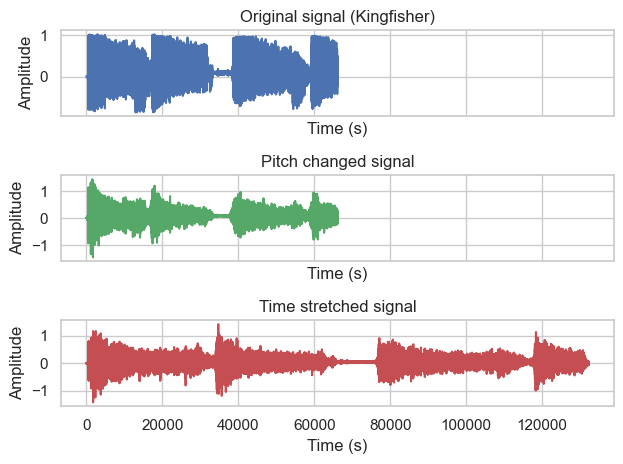

In [68]:
# Load sample audio
def sample_plot(signal, augmented_signal1, augmented_signal2, sr):
    fig, ax = plt.subplots(nrows=3, sharex=True)
    
    ax[0].plot(signal, color='b')
    ax[0].set_title("Original signal (Kingfisher)")
    
    ax[1].plot(augmented_signal1, color='g')
    ax[1].set_title("Pitch changed signal")
    
    ax[2].plot(augmented_signal2, color='r')
    ax[2].set_title("Time stretched signal")
    
    ax[0].set_xlabel('Time (s)')
    ax[1].set_xlabel('Time (s)')
    ax[2].set_xlabel('Time (s)')
    
    ax[0].set_ylabel('Amplitude')
    ax[1].set_ylabel('Amplitude')
    ax[2].set_ylabel('Amplitude')
    
    plt.tight_layout()
    plt.show()

# Load sample audio and plot augment
signal, sr = librosa.load(r'C:\Users\leeju\Bird\Kingfisher.001.wav')

augmented_signal1 = pitch_scale(signal, sr, 0.5)
augmented_signal2 = time_stretch(signal, sr, 0.5)
sample_plot(signal, augmented_signal1, augmented_signal2, sr)

 - Valerio Velardo has provided many helpful audio augmentation methods to be used from above

In [119]:
# Set highest count for difference
highest_count_class = max(extracted_df['class'].value_counts())

# stratification
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Iterate over the folds
for fold, (train_index, val_index) in enumerate(skf.split(extracted_df['feature'], extracted_df['class'])):
    X_train_augmented = []

    for signal in X_train:
        # Get the count for the current class
        current_count = extracted_df['class'].value_counts()[signal]

        # Calculate the difference between the highest count class and the current class
        difference = highest_count_class - current_count

        # Calculate the amount of augmentation to apply for time stretch and pitch scale
        time_stretch_augmentation = (difference/2)
        pitch_scale_augmentation = (difference/2)

        augmented_signal1 = time_stretch_rate(signal, sr, time_stretch_rate=time_stretch_augmentation)
        augmented_signal2 = pitch_scale(signal, sr, num_semitones=pitch_scale_augmentation)
        X_train_augmented.append(augmented_signal1, augmented_signal2)

ValueError: Supported target types are: ('binary', 'multiclass'). Got 'unknown' instead.

## Test (development help from Kapil work)

In [120]:
### Define convolutional network architecture ###
def getModel():
    num_filters = [24,32,64,128]
    pool_size = (2, 2)
    kernel_size = (3, 3)
    #input_shape = (60, 41, 2)
    #input_shape = (168 ,16,8)
    #input_shape = (168,8,1)
    #input_shape = (,16,8)


    input_shape = (16,8,1)
    num_classes = 44
    keras.backend.clear_session()

    model = keras.models.Sequential()
    model.add(keras.layers.Conv2D(24, kernel_size,
                padding="same", input_shape=input_shape))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Activation("relu"))
    model.add(keras.layers.MaxPooling2D(pool_size=pool_size))

    model.add(keras.layers.Conv2D(32, kernel_size,
                                  padding="same"))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Activation("relu"))
    model.add(keras.layers.MaxPooling2D(pool_size=pool_size))

    model.add(keras.layers.Conv2D(64, kernel_size,
                                  padding="same"))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Activation("relu"))
    model.add(keras.layers.MaxPooling2D(pool_size=pool_size))

    model.add(keras.layers.Conv2D(128, kernel_size,
                                  padding="same"))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Activation("relu"))

    model.add(keras.layers.GlobalMaxPooling2D())
    model.add(keras.layers.Dense(128, activation="relu"))
    model.add(keras.layers.Dense(num_classes, activation="softmax"))

    return model

model = getModel()

In [121]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 8, 24)         240       
                                                                 
 batch_normalization (BatchN  (None, 16, 8, 24)        96        
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 16, 8, 24)         0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 8, 4, 24)         0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 8, 4, 32)          6944      
                                                                 
 batch_normalization_1 (Batc  (None, 8, 4, 32)         1

In [122]:
#from tensorflow.keras.utils import to_categorical
# List for trian and val accuracy

train_acc = []
val_acc = []

# List for train and val loss 
train_loss = []
val_loss = []

cnn_cm = []
cr = []

skf.get_n_splits(X, y)
labelencoder=LabelEncoder()
batch_size = 128
num_classes = 44
foldNum = 0

for train_index, val_index in skf.split(X, y):
    foldNum += 1
    print("Results for fold", foldNum)
    X_train, X_val = X[train_index], X[val_index]
    y_train, y_val = y[train_index], y[val_index]
    
    #X_train = X_train.reshape((-1, 16, 8, 1))
    #X_val = X_val.reshape((-1, 16, 8, 1))
    
    train_dataset = create_dataset(X_train, y_train)
    val_dataset = create_dataset(X_val, y_val)
    
    # Batch the data and labels
    train_dataset = train_dataset.batch(batch_size)
    val_dataset = val_dataset.batch(batch_size)
    
    # one hot encode
    y_train = to_categorical(y_train, num_classes)
    y_val = to_categorical(y_val, num_classes)
    
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    history = model.fit(train_dataset, epochs=100, validation_data=val_dataset)

    yPredict = model.predict(X_val)

    # Convert one-hot encoded predictions to labels
    pred = np.argmax(yPredict, axis=1)
    val = y_val.argmax(axis=1)  # Get the actual class labels from one-hot encoding
    showResults(val, pred)

Results for fold 1


NameError: name 'create_dataset' is not defined

In [123]:
from tensorflow.keras.callbacks import ModelCheckpoint
from datetime import datetime

# Define the new input shape based on your audio feature extraction
# For example, if your audio features are 2D spectrograms with shape (num_samples, num_time_steps, num_features)
# You should adjust input_shape accordingly
input_shape = (16,8,1)

num_epochs = 100
num_batch_size = 32

checkpointer = ModelCheckpoint(filepath='saved_models/audio_classification.hdf5', 
                               verbose=1, save_best_only=True)
start = datetime.now()

# Reshape your training and validation data to match the new input shape
#X_train_reshaped = X_train.reshape(-1, *input_shape)
#X_val_reshaped = X_val.reshape(-1, *input_shape)

model.fit(X_train, y_train, batch_size=num_batch_size, epochs=num_epochs, validation_data=(X_val, y_val), callbacks=[checkpointer], verbose=1)


duration = datetime.now() - start
print("Training completed in time: ", duration)


RuntimeError: You must compile your model before training/testing. Use `model.compile(optimizer, loss)`.

In [124]:
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt

# Assuming you have already defined smote_strategy and undersample_strategy dictionaries
total_counts = Counter()

#smote_strategy = {k: v for k, v in total_counts.items()}
#undersample_strategy = {k: v for k, v in total_counts.items()}

for train_index, val_index in mskf.split(X, y):
    X_train, X_val = X[train_index], X[val_index]
    y_train, y_val = y[train_index], y[val_index]

    # Apply SMOTE to balance classes in the training set
    smote = SMOTE(sampling_strategy=smote_strategy, random_state=42)
    X_train_resampled, y_train_resampled = smote.fit_resample(X, y)

# Initialize a list to store the balanced data for each fold
X_train_resampled_folds = []
y_train_resampled_folds = []

# Loop through each fold
for fold, (train_index, val_index) in enumerate(mskf.split(X, y)):
    # Split the data into training and validation sets for this fold
    X_train, X_val = X[train_index], X[val_index]
    y_train, y_val = y[train_index], y[val_index]

    # Calculate the maximum class count within this fold
    max_class_count = class_counts_per_fold[fold].max()

    # Create a dictionary to specify the SMOTE sampling strategy for this fold
    smote_strategy_fold = {k: max_class_count for k in smote_strategy.keys()}

    # Apply SMOTE to balance classes in the training set for this fold
    smote = SMOTE(sampling_strategy=smote_strategy_fold, random_state=42)
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

    # Append the balanced data to the list for this fold
    X_train_resampled_folds.append(X_train_resampled)
    y_train_resampled_folds.append(y_train_resampled)

    # Print the class counts after SMOTE for this fold
    print(f"Fold {fold + 1} Class Counts after SMOTE:")
    print(pd.Series(y_train_resampled).value_counts())
    print()

# Now, X_train_resampled_folds and y_train_resampled_folds contain the balanced data for each fold
# You can use these for training in your model


NameError: name 'mskf' is not defined

## CNN model

In [ ]:
### Define convolutional network architecture ###
def getModel():
    num_filters = [24,32,64,128]
    pool_size = (2, 2)
    kernel_size = (3, 3)
    #input_shape = (60, 41, 2)
    #input_shape = (168 ,16,8)
    #input_shape = (168,8,1)
    #input_shape = (,16,8)


    input_shape = (16,8,1)
    num_classes = 46
    keras.backend.clear_session()

    model = keras.models.Sequential()
    model.add(keras.layers.Conv2D(24, kernel_size,
                padding="same", input_shape=input_shape))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Activation("relu"))
    model.add(keras.layers.MaxPooling2D(pool_size=pool_size))

    model.add(keras.layers.Conv2D(32, kernel_size,
                                  padding="same"))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Activation("relu"))
    model.add(keras.layers.MaxPooling2D(pool_size=pool_size))

    model.add(keras.layers.Conv2D(64, kernel_size,
                                  padding="same"))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Activation("relu"))
    model.add(keras.layers.MaxPooling2D(pool_size=pool_size))

    model.add(keras.layers.Conv2D(128, kernel_size,
                                  padding="same"))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Activation("relu"))

    model.add(keras.layers.GlobalMaxPooling2D())
    model.add(keras.layers.Dense(128, activation="relu"))
    model.add(keras.layers.Dense(num_classes, activation="softmax"))

    model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
        loss=keras.losses.CategoricalCrossentropy(),
        metrics=["accuracy"])
    return model

model = getModel()

In [ ]:
# List for train and val loss 

train_acc = []
val_acc = []

train_loss = []
val_loss = []

cnn_cm = []
cr = []

# fold counter
foldNum = 0

for train_index, val_index in skf.split(X, y):
    foldNum += 1
    print("Results for fold", foldNum)
    X_train, X_val = X_train[train_index], X_train[val_index]
    Y_train, Y_val = Y_train[train_index], Y_train[val_index]

    
    # Append lists
    train_acc.append(history.history['accuracy'])
    val_acc.append(history.history['val_accuracy'])
    
    train_loss.append(history.history['loss'])
    val_loss.append(history.history['val_loss'])

    yPredict = model.predict(X_val)

    # Convert one-hot encoded predictions to labels
    pred = np.argmax(yPredict, axis=1)
    val = Y_val.argmax(axis=1)  
    
    confusion = confusion_matrix(val, pred)
    cnn_cm.append(confusion)

    # Calculate and store the classification report
    class_report = classification_report(val, pred)
    cr.append(class_report)

In [104]:
for n in range(foldNum):
    plt.plot(train_acc[n], label=f'Train Accuracy - Fold {n+1}')
    plt.plot(val_acc[n], label=f'Validation Accuracy - Fold {n+1}')
    plt.title(f'Accuracy for Fold {n+1} model (CNN)')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend()
    plt.show()

NameError: name 'foldNum' is not defined

In [ ]:
for n in range(foldNum):
    plt.plot(train_loss[n], label=f'Train Loss - Fold {n+1}')
    plt.plot(val_loss[n], label=f'Validation Loss - Fold {n+1}')
    plt.title(f'Loss for Fold {n+1} model (CNN)')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend()
    plt.show()